In [1]:
# --- 1. DATA LOADING & CLEANING ---
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from scipy.stats import linregress

# Load both datasets and combine them
df_main = pd.read_csv('SalinityMain.csv', low_memory=False)
df_trib = pd.read_csv('SalinityTributary.csv', low_memory=False)
df = pd.concat([df_main, df_trib], ignore_index=True)

# Convert types and filter specifically for Salinity
df['SampleDate'] = pd.to_datetime(df['SampleDate'])
df['MeasureValue'] = pd.to_numeric(df['MeasureValue'], errors='coerce')
salinity_df = df[df['Parameter'] == 'SALINITY'].dropna(subset=['MeasureValue', 'SampleDate']).copy()

In [2]:
# --- 2. STATION FILTERING ---
# Some decommissioned stations in the dataset stopped taking measurements years ago
# We can filter them out with a rule: stations must have taken data points within the last 5 years
latest_date = salinity_df['SampleDate'].max()
cutoff_date = latest_date - pd.DateOffset(years=5)

valid_stations = []
for station in salinity_df['Station'].unique():
    subset = salinity_df[salinity_df['Station'] == station]
    if len(subset) >= 5 and subset['SampleDate'].max() >= cutoff_date:
        valid_stations.append(station)

print(f"Analyzing {len(valid_stations)} stations active post-{cutoff_date.year}.")

Analyzing 171 stations active post-2020.


In [3]:
# --- 3. TREND CALCULATION & TIME-SERIES PLOTTING ---
# Setup subplots for every valid station to explore our cleaned dataset!
fig_ts, axes = plt.subplots(nrows=len(valid_stations), ncols=1, figsize=(12, 4 * len(valid_stations)))
if len(valid_stations) == 1: axes = [axes] # Handle single station case

station_data_summary = []

for i, station in enumerate(valid_stations):
    # Sort data chronologically for regression and plotting
    s_data = salinity_df[salinity_df['Station'] == station].sort_values('SampleDate')
    
    # Perform Linear Regression
    x_ord = s_data['SampleDate'].map(pd.Timestamp.toordinal)
    y_val = s_data['MeasureValue']
    slope, intercept, _, _, _ = linregress(x_ord, y_val)
    rate_per_year = slope * 365.25
    
    # Store metadata and results for the map and table later
    station_data_summary.append({
        "Station": station,
        "Lat": s_data['Latitude'].iloc[0],
        "Lon": s_data['Longitude'].iloc[0],
        "Rate": rate_per_year,
        "Area": "Mainstem" if station.startswith('CB') else "Tributary"
    })
    
    # Create the time-series plot
    ax = axes[i]
    ax.scatter(s_data['SampleDate'], s_data['MeasureValue'], alpha=0.3, color='blue', s=10)
    ax.plot(s_data['SampleDate'], intercept + slope * x_ord, color='darkgreen', linewidth=2, 
            label=f'Trend: {rate_per_year:.3f} PPT/yr')
    
    # Formatting axes
    ax.xaxis.set_major_locator(mdates.YearLocator(2))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    ax.set_title(f"Area: {station_data_summary[-1]['Area']} | Station: {station}")
    ax.set_ylabel("Salinity (PPT)")
    ax.legend(loc='upper left')
    ax.grid(True, alpha=0.2)
    ax.set_xlabel("Year")

plt.tight_layout()
plt.show()

In [5]:
# --- 4. SUMMARY TABLE & EXPORT ---
# Convert the list of results into a clean DataFrame
stats_df = pd.DataFrame(station_data_summary)

# Rename and reorder columns, mapping old names to specific new names
column_mapping = {
    'Station': 'Station ID',
    'Area': 'Area',
    'Lat': 'Lat',
    'Lon': 'Lon',
    'Rate': 'Rate (PPT/yr)'
}

salinity_df = stats_df.rename(columns=column_mapping)

# Lock in the specific order requested
salinity_df = salinity_df[['Station ID', 'Area', 'Lat', 'Lon', 'Rate (PPT/yr)']]

# Calculate general trend using the new column name
avg_rate = salinity_df['Rate (PPT/yr)'].mean()
trend_direction = "increased" if avg_rate > 0 else "decreased"

print("-" * 65)
print(f"OVERALL TREND: Across these stations, salinity has generally {trend_direction}")
print(f"at an average rate of {avg_rate:.4f} PPT/year.")
print("-" * 65)

# Export to CSV
salinity_df.to_csv('Salinity_Trend_Summary.csv', index=False)
print("\nDetailed summary saved to 'Salinity_Trend_Summary.csv'")

salinity_df

-----------------------------------------------------------------
OVERALL TREND: Across these stations, salinity has generally increased
at an average rate of 0.0167 PPT/year.
-----------------------------------------------------------------

Detailed summary saved to 'Salinity_Trend_Summary.csv'


,Station ID,Area,Lat,Lon,Rate (PPT/yr)
0,CB1.1,Mainstem,39.54794,-76.08481,-0.000007
1,CB2.1,Mainstem,39.44149,-76.02599,0.005476
2,CB2.2,Mainstem,39.34873,-76.17579,-0.017120
3,CB3.1,Mainstem,39.24950,-76.24050,-0.005725
4,CB3.2,Mainstem,39.16369,-76.30631,0.002093
...,...,...,...,...,...
166,XAK7810,Tributary,37.96395,-75.65047,0.146098
167,XCI4078,Tributary,38.23379,-75.86963,0.090928
168,XDJ9007,Tributary,38.48375,-75.82098,0.076258
169,XFB1986,Tributary,38.69787,-77.02317,-0.002508


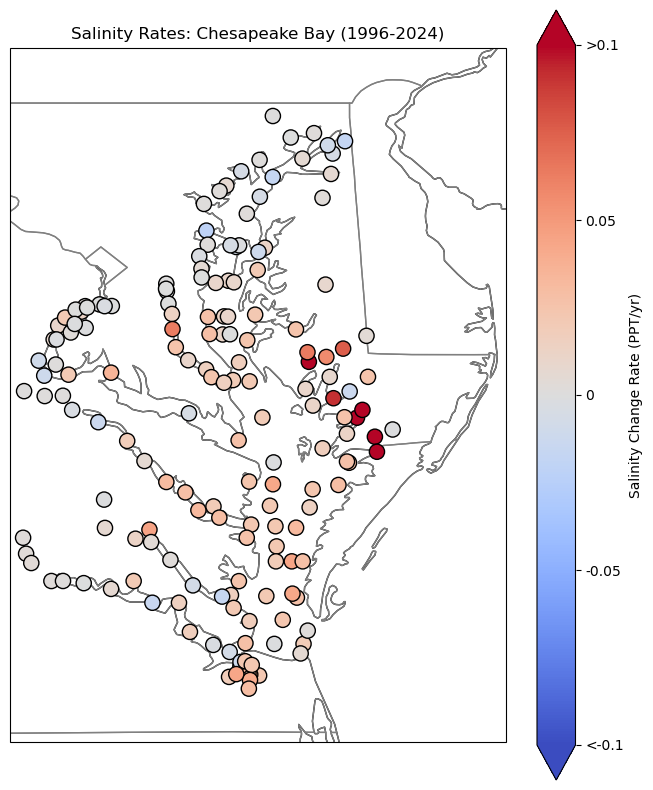

In [7]:
# --- 5. GEOGRAPHIC MAP ---
# Filter outliers (like LE5.5) to keep the color scale readable on the map
plot_df = salinity_df[salinity_df['Rate (PPT/yr)'] < 1.0].copy()

fig_map = plt.figure(figsize=(8, 10))
ax_map = plt.axes(projection=ccrs.PlateCarree())

# Add map layers
ax_map.add_feature(cfeature.COASTLINE, linewidth=1)
ax_map.add_feature(cfeature.STATES, edgecolor='gray')
ax_map.set_extent([-77.5, -75.0, 36.5, 40.0], crs=ccrs.PlateCarree())

# Plot "Heatmap" points
scatter = ax_map.scatter(
    plot_df['Lon'], 
    plot_df['Lat'], 
    c=plot_df['Rate (PPT/yr)'],
    cmap='coolwarm', 
    s=120, 
    edgecolor='black', 
    zorder=5,
    vmin=-0.1,
    vmax=0.1
)

# Add Legend/Colorbar
# 'both' creates arrows at both ends; 'max' would just do the top
cbar = plt.colorbar(scatter, orientation='vertical', pad=0.05, aspect=20, extend='both')

# Manually set the ticks and their labels
# This defines where the marks are
ticks = [-0.1, -0.05, 0, 0.05, 0.1]
cbar.set_ticks(ticks)

# This defines what the text actually says
cbar.set_ticklabels(['<-0.1', '-0.05', '0', '0.05', '>0.1'])

cbar.set_label('Salinity Change Rate (PPT/yr)')

plt.title(f"Salinity Rates: Chesapeake Bay (1996-2024)")
plt.show()